### Transformada Discreta do Cosseno - DCT

Biblioteca

In [1]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import random
import math
from scipy.fftpack import dct, idct

Carregando a Imagens

In [2]:
imagem_original = Image.open('lenna.jpg')
imagem_cinza = imagem_original.convert('L') # colocando a imagem em trons de cinza
matriz_imagem = np.array(imagem_cinza) # transformado a imagem em array numpy

print("Dimensões do array: ", matriz_imagem.shape)

Dimensões do array:  (512, 512)


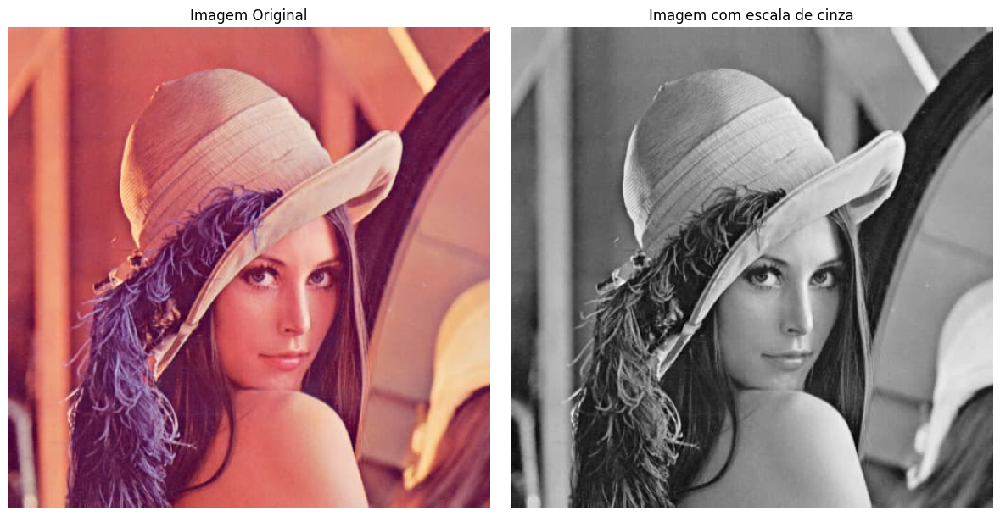

In [3]:
# Plot das imagens Original x Cinza

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(imagem_original, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem com escala de cinza')
plt.axis('off')

plt.tight_layout()
plt.show()

In [4]:
# Função para aplicar DCT 2D
def dct2(block):
    return dct(dct(block.T, norm='ortho').T, norm='ortho')

In [5]:
# Função para aplicar IDCT 2D
def idct2(block):
    return idct(idct(block.T, norm='ortho').T, norm='ortho')

In [6]:
# Dividir a imagem em blocos de 64x64
h, w = matriz_imagem.shape
bloco_tamanho = 64
dct_result = np.zeros_like(matriz_imagem, dtype=np.float32)

In [7]:
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64
        bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a DCT no bloco
        dct_bloco = dct2(bloco.astype(np.float32))
        
        # Salvar o resultado da DCT no local correspondente
        dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_bloco
        
        # print(f"Processado bloco em ({i},{j})")

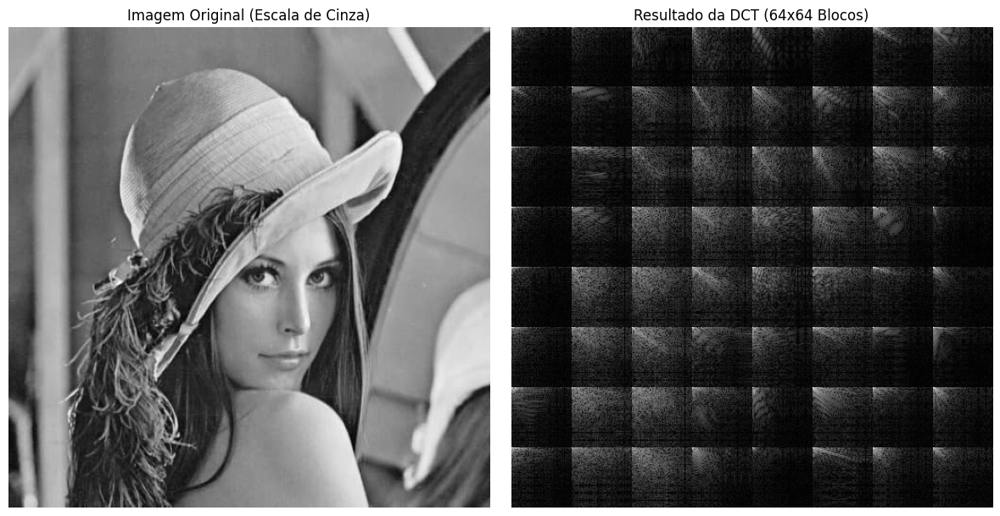

In [8]:
# Visualizar a imagem original e o resultado da DCT
plt.figure(figsize=(12, 6))

# A - Imagem original
plt.subplot(1, 2, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT
plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT (64x64 Blocos)')
plt.axis('off')

plt.tight_layout()
plt.show()

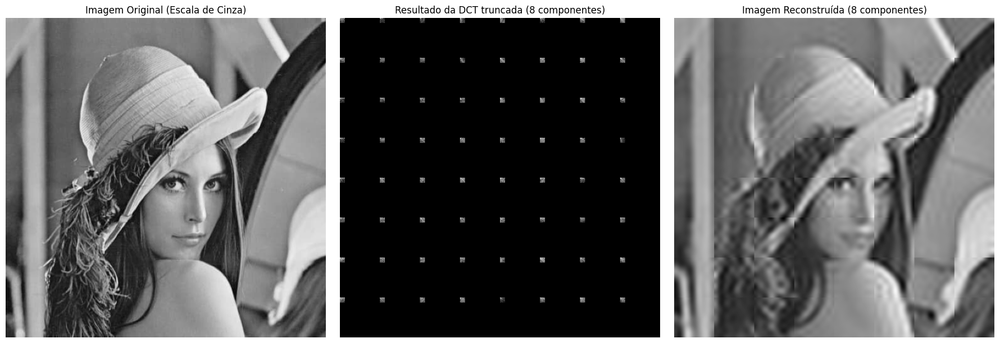

In [9]:
# Função para truncar a DCT para os 8 primeiros coeficientes
def truncar_dct_para_8_componentes(dct_bloco, num_componentes=8):
    bloco_truncado = np.zeros_like(dct_bloco)
    # Preservar os primeiros 8 coeficientes (num_componentes x num_componentes)
    bloco_truncado[:num_componentes, :num_componentes] = dct_bloco[:num_componentes, :num_componentes]
    return bloco_truncado

# Aplicar a DCT com truncagem para 8 componentes
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64
        bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a DCT no bloco
        dct_bloco = dct2(bloco.astype(np.float32))
        
        # Truncar os coeficientes da DCT para os 8 primeiros
        dct_truncado = truncar_dct_para_8_componentes(dct_bloco)
        
        # Salvar o resultado da DCT truncada no local correspondente
        dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_truncado
        
#         print(f"Processado bloco em ({i},{j}) com truncagem para 8 componentes")

# Criar uma matriz para armazenar a imagem reconstruída
imagem_reconstruida = np.zeros_like(matriz_imagem, dtype=np.float32)

# Aplicar a IDCT para cada bloco de 64x64
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64 da DCT truncada
        dct_bloco = dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a IDCT para recriar o bloco de imagem
        bloco_reconstruido = idct2(dct_bloco)
        
        # Salvar o bloco reconstruído na imagem final
        imagem_reconstruida[i:i+bloco_tamanho, j:j+bloco_tamanho] = bloco_reconstruido

# Visualizar a imagem original, o resultado da DCT truncada e a imagem reconstruída
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT truncada
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT truncada (8 componentes)')
plt.axis('off')

# C - Imagem reconstruída a partir da DCT truncada
plt.subplot(1, 3, 3)
plt.imshow(imagem_reconstruida, cmap='gray')
plt.title('Imagem Reconstruída (8 componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


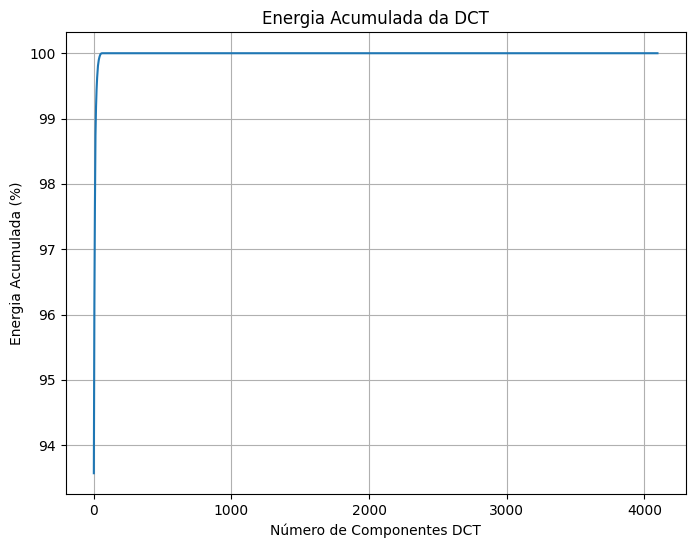

In [10]:
# Função para calcular a energia acumulada da DCT
def calcular_energia_acumulada(dct_image):
    # Calcular a energia (quadrado dos coeficientes)
    energia = np.abs(dct_image)**2
    
    # Ordenar os coeficientes de energia em ordem decrescente
    energia_flat = np.sort(energia.ravel())[::-1]  # Ordenar e achatar (ravel)
    
    # Energia total
    energia_total = np.sum(energia_flat)
    
    # Energia acumulada
    energia_acumulada = np.cumsum(energia_flat)  # Soma acumulada
    
    # Porcentagem de energia acumulada
    energia_acumulada_percentual = (energia_acumulada / energia_total) * 100
    
    return energia_acumulada_percentual


# Aplicar a DCT 2D na imagem completa
dct_imagem = dct2(matriz_imagem)

# Calcular a energia acumulada da DCT
energia_acumulada_percentual = calcular_energia_acumulada(dct_bloco)

# Plotar a energia acumulada
plt.figure(figsize=(8, 6))
plt.plot(energia_acumulada_percentual)
plt.title('Energia Acumulada da DCT')
plt.xlabel('Número de Componentes DCT')
plt.ylabel('Energia Acumulada (%)')
plt.grid(True)
plt.show()

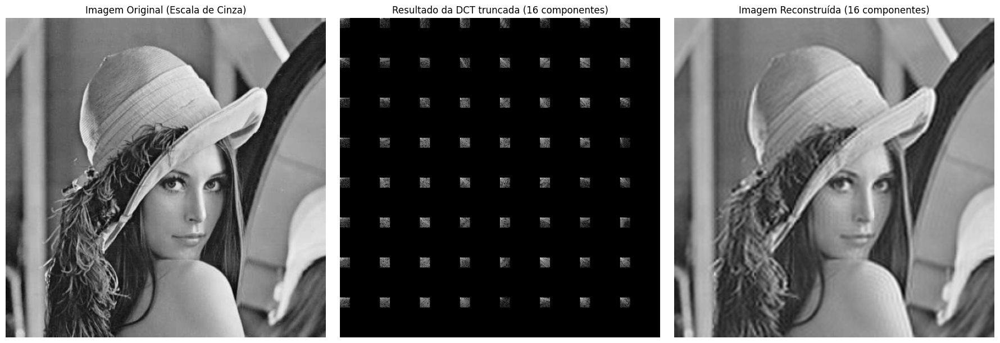

In [11]:
# Função para truncar a DCT para os 16 primeiros coeficientes
def truncar_dct_para_16_componentes(dct_bloco, num_componentes=16):
    bloco_truncado = np.zeros_like(dct_bloco)
    # Preservar os primeiros 16 coeficientes (num_componentes x num_componentes)
    bloco_truncado[:num_componentes, :num_componentes] = dct_bloco[:num_componentes, :num_componentes]
    return bloco_truncado

# Aplicar a DCT com truncagem para 16 componentes
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64
        bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a DCT no bloco
        dct_bloco = dct2(bloco.astype(np.float32))
        
        # Truncar os coeficientes da DCT para os 16 primeiros
        dct_truncado = truncar_dct_para_16_componentes(dct_bloco)
        
        # Salvar o resultado da DCT truncada no local correspondente
        dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_truncado
        
#         print(f"Processado bloco em ({i},{j}) com truncagem para 16 componentes")

# Criar uma matriz para armazenar a imagem reconstruída
imagem_reconstruida = np.zeros_like(matriz_imagem, dtype=np.float32)

# Aplicar a IDCT para cada bloco de 64x64
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64 da DCT truncada
        dct_bloco = dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a IDCT para recriar o bloco de imagem
        bloco_reconstruido = idct2(dct_bloco)
        
        # Salvar o bloco reconstruído na imagem final
        imagem_reconstruida[i:i+bloco_tamanho, j:j+bloco_tamanho] = bloco_reconstruido

# Visualizar a imagem original, o resultado da DCT truncada e a imagem reconstruída
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT truncada
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT truncada (16 componentes)')
plt.axis('off')

# C - Imagem reconstruída a partir da DCT truncada
plt.subplot(1, 3, 3)
plt.imshow(imagem_reconstruida, cmap='gray')
plt.title('Imagem Reconstruída (16 componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


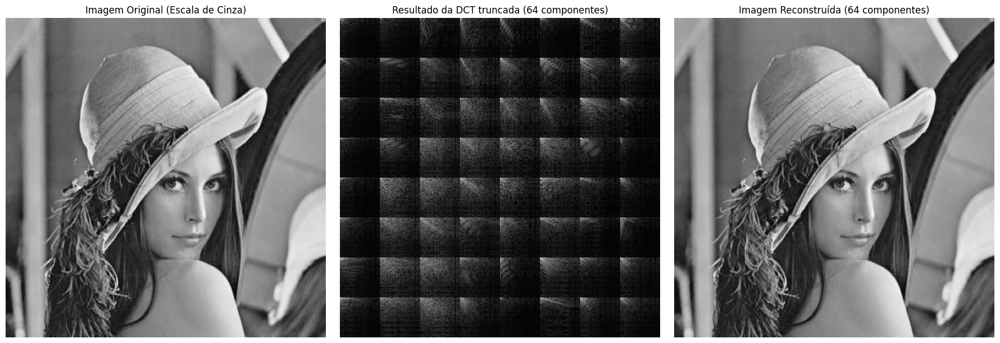

In [12]:
# Função para truncar a DCT para os 64 primeiros coeficientes
def truncar_dct_para_64_componentes(dct_bloco, num_componentes=64):
    bloco_truncado = np.zeros_like(dct_bloco)
    # Preservar os primeiros 64 coeficientes (num_componentes x num_componentes)
    bloco_truncado[:num_componentes, :num_componentes] = dct_bloco[:num_componentes, :num_componentes]
    return bloco_truncado

# Aplicar a DCT com truncagem para 64 componentes
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64
        bloco = matriz_imagem[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a DCT no bloco
        dct_bloco = dct2(bloco.astype(np.float32))
        
        # Truncar os coeficientes da DCT para os 64 primeiros
        dct_truncado = truncar_dct_para_64_componentes(dct_bloco)
        
        # Salvar o resultado da DCT truncada no local correspondente
        dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dct_truncado
        
        # print(f"Processado bloco em ({i},{j}) com truncagem para 64 componentes")

# Criar uma matriz para armazenar a imagem reconstruída
imagem_reconstruida = np.zeros_like(matriz_imagem, dtype=np.float32)

# Aplicar a IDCT para cada bloco de 64x64
for i in range(0, h, bloco_tamanho):
    for j in range(0, w, bloco_tamanho):
        # Extrair o bloco 64x64 da DCT truncada
        dct_bloco = dct_result[i:i+bloco_tamanho, j:j+bloco_tamanho]
        
        # Aplicar a IDCT para recriar o bloco de imagem
        bloco_reconstruido = idct2(dct_bloco)
        
        # Salvar o bloco reconstruído na imagem final
        imagem_reconstruida[i:i+bloco_tamanho, j:j+bloco_tamanho] = bloco_reconstruido

# Visualizar a imagem original, o resultado da DCT truncada e a imagem reconstruída
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DCT truncada
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dct_result) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('Resultado da DCT truncada (64 componentes)')
plt.axis('off')

# C - Imagem reconstruída a partir da DCT truncada
plt.subplot(1, 3, 3)
plt.imshow(imagem_reconstruida, cmap='gray')
plt.title('Imagem Reconstruída (64 componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


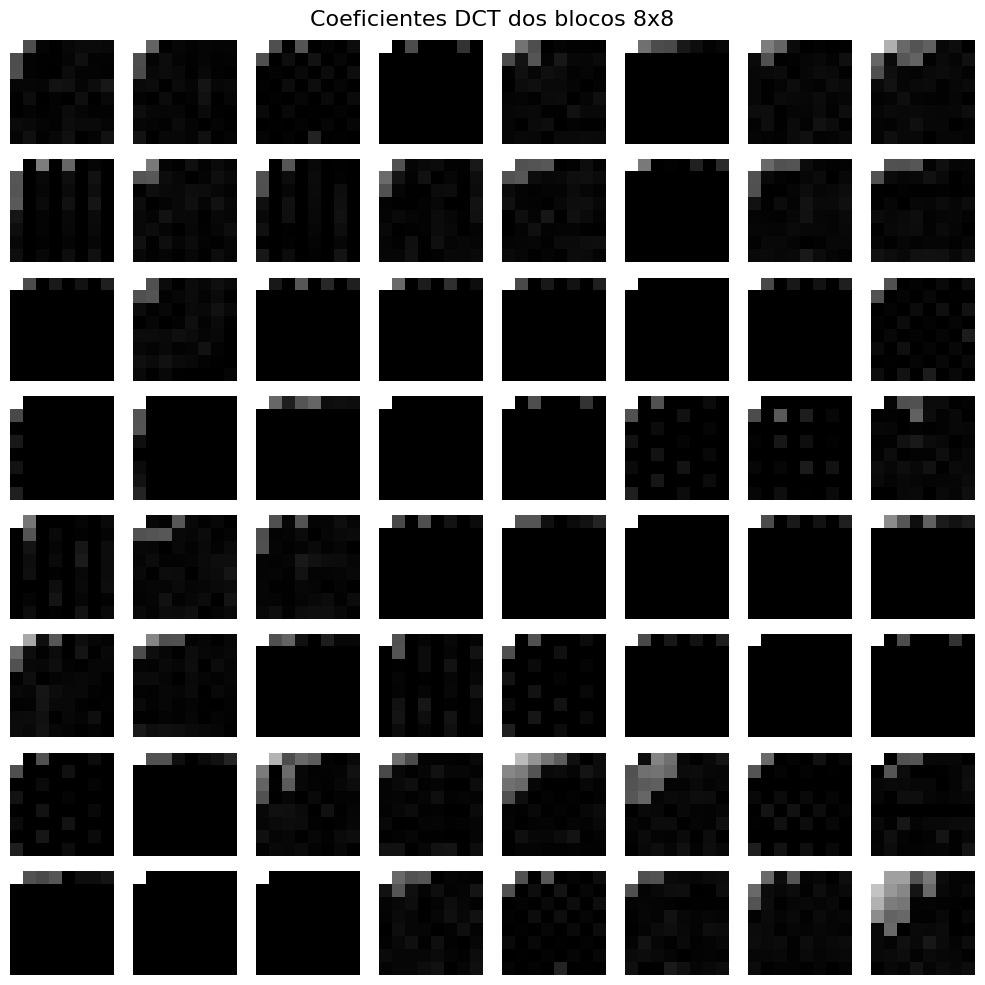

In [13]:
# Função para dividir a imagem em blocos de NxN
def dividir_em_blocos(matriz_imagem, N):
    h, w = matriz_imagem.shape
    blocos = []
    for i in range(0, h, N):
        for j in range(0, w, N):
            bloco = matriz_imagem[i:i+N, j:j+N]
            blocos.append(bloco)
    return blocos

# Função para visualizar os coeficientes da DCT
def visualizar_dct(blocos_dct, N):
    fig, axs = plt.subplots(8, 8, figsize=(10, 10))
    for i in range(8):
        for j in range(8):
            bloco_dct = blocos_dct[i * 8 + j]  # Pegar o bloco correspondente
            axs[i, j].imshow(np.log(np.abs(bloco_dct) + 1), cmap='gray')  # Visualização logarítmica
            axs[i, j].axis('off')
    plt.suptitle(f'Coeficientes DCT dos blocos 8x8', fontsize=16)
    plt.tight_layout()
    plt.show()

# Parâmetros
N = 8  # Tamanho dos blocos 8x8

# Dividir a imagem em blocos 8x8
blocos = dividir_em_blocos(matriz_imagem, N)

# Aplicar a DCT em cada bloco
blocos_dct = [dct2(bloco.astype(np.float32)) for bloco in blocos]

# Visualizar os coeficientes da DCT dos primeiros 64 blocos
visualizar_dct(blocos_dct, N)

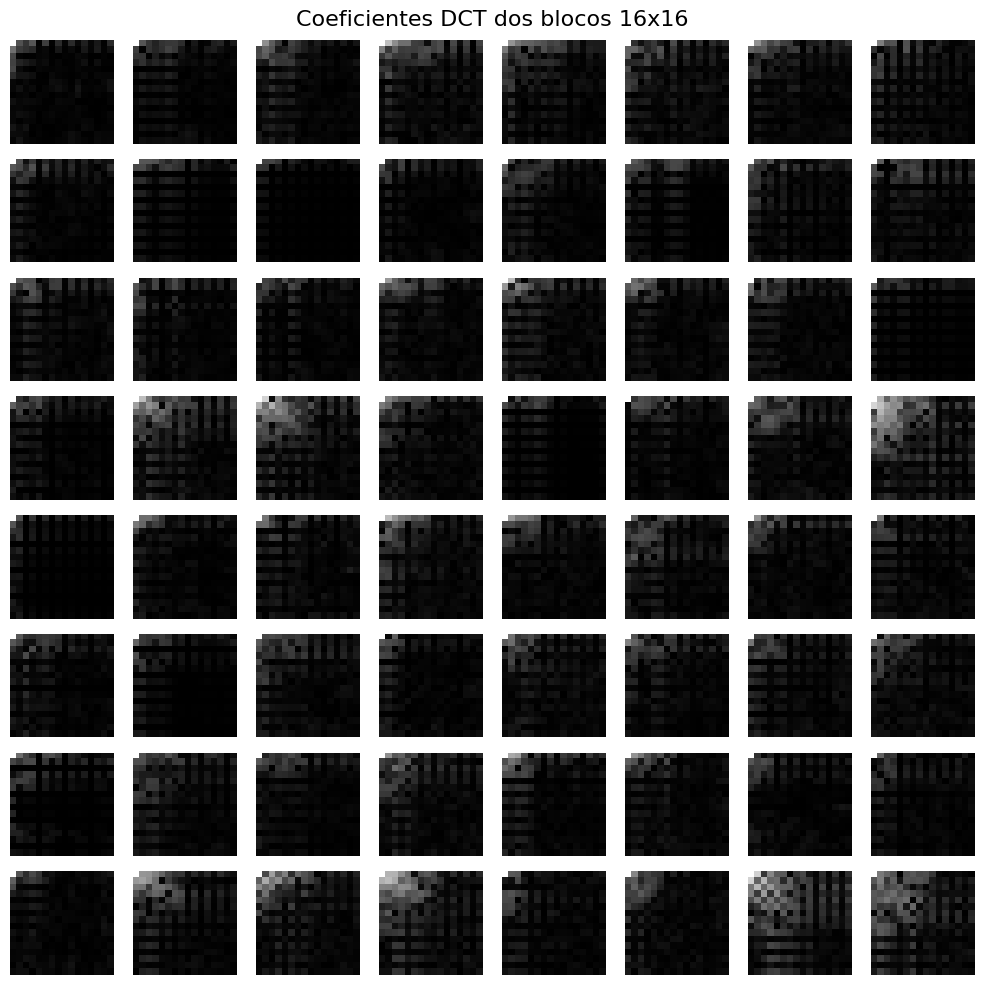

In [14]:
# Função para dividir a imagem em blocos de NxN
def dividir_em_blocos(matriz_imagem, N):
    h, w = matriz_imagem.shape
    blocos = []
    for i in range(0, h, N):
        for j in range(0, w, N):
            bloco = matriz_imagem[i:i+N, j:j+N]
            blocos.append(bloco)
    return blocos

# Função para visualizar os coeficientes da DCT
def visualizar_dct(blocos_dct, N):
    fig, axs = plt.subplots(8, 8, figsize=(10, 10))
    for i in range(8):
        for j in range(8):
            bloco_dct = blocos_dct[i * 8 + j]  # Pegar o bloco correspondente
            axs[i, j].imshow(np.log(np.abs(bloco_dct) + 1), cmap='gray')  # Visualização logarítmica
            axs[i, j].axis('off')
    plt.suptitle(f'Coeficientes DCT dos blocos 16x16', fontsize=16)
    plt.tight_layout()
    plt.show()

# Parâmetros
N = 16  # Tamanho dos blocos 16x16

# Dividir a imagem em blocos 16x16
blocos = dividir_em_blocos(matriz_imagem, N)

# Aplicar a DCT em cada bloco
blocos_dct = [dct2(bloco.astype(np.float32)) for bloco in blocos]

# Visualizar os coeficientes da DCT dos primeiros 64 blocos
visualizar_dct(blocos_dct, N)

Representação gráfica do núcleo da transformada discreta do cosseno DCT para um vetor com oito componentes

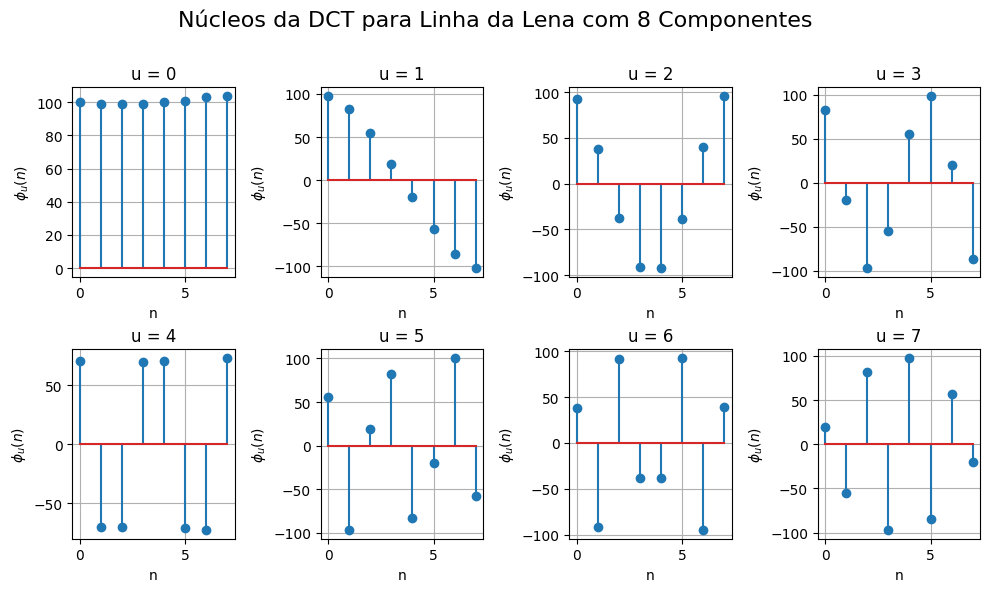

In [15]:
# Função para gerar os vetores base da DCT-1D
def gerar_vetores_base_dct(N):
    base_dct = np.zeros((N, N))
    for u in range(N):
        for n in range(N):
            base_dct[u, n] = np.cos(np.pi * u * (2 * n + 1) / (2 * N))
    return base_dct

# Selecionar uma linha da imagem da Lena (linha do meio)
linha_lena = matriz_imagem[matriz_imagem.shape[0] // 2, :8]  # Pegando apenas os 8 primeiros componentes

# Aplicar a DCT na linha da Lena
dct_linha_lena = dct(linha_lena, type=2, norm='ortho')

# Gerar os vetores base da DCT
base_dct_lena = gerar_vetores_base_dct(8)

# Visualizar os vetores base da DCT para a linha da imagem da Lena
plt.figure(figsize=(10, 6))

for u in range(8):
    plt.subplot(2, 4, u + 1)  # Criar subplots para cada vetor base
    plt.stem(base_dct_lena[u] * linha_lena)  # Removendo use_line_collection
    plt.title(f'u = {u}')
    plt.xlabel('n')
    plt.ylabel('$\phi_u(n)$')
    plt.grid(True)

plt.tight_layout()
plt.suptitle('Núcleos da DCT para Linha da Lena com 8 Componentes', fontsize=16)
plt.subplots_adjust(top=0.85)
plt.show()

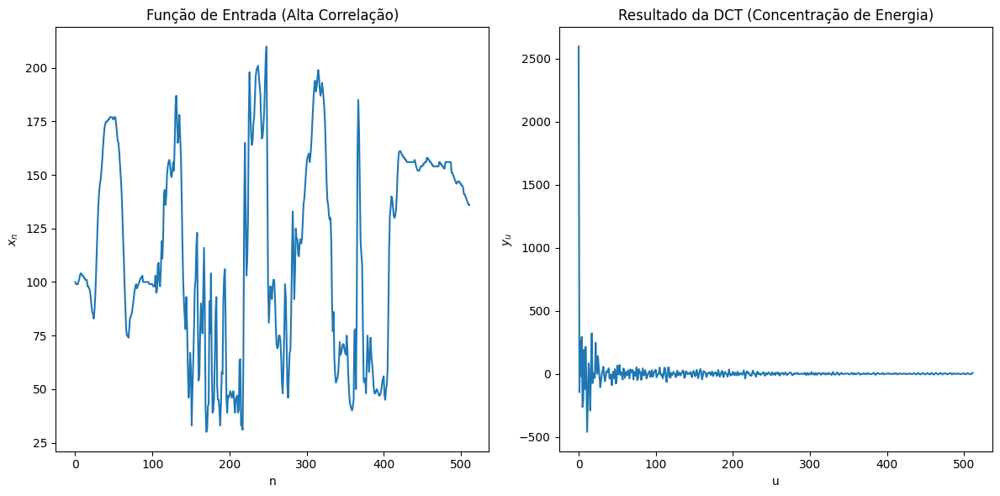

In [16]:
# Selecionar uma linha da imagem (por exemplo, a linha do meio)
linha = matriz_imagem[matriz_imagem.shape[0] // 2, :]

# Aplicar a DCT e DST 1D na linha
dct_linha = dct(linha, type=2, norm='ortho')

# Visualizar o gráfico da função de entrada (alta correlação) e a concentração de energia
plt.figure(figsize=(12, 6))

# A - Função de entrada (Linha da Imagem - Alta Correlação)
plt.subplot(1, 2, 1)
plt.plot(linha)
plt.title('Função de Entrada (Alta Correlação)')
plt.xlabel('n')
plt.ylabel('$x_n$')

# B - Resultado da DCT (Concentração de Energia)
plt.subplot(1, 2, 2)
plt.plot(dct_linha)
plt.title('Resultado da DCT (Concentração de Energia)')
plt.xlabel('u')
plt.ylabel('$y_u$')

plt.tight_layout()

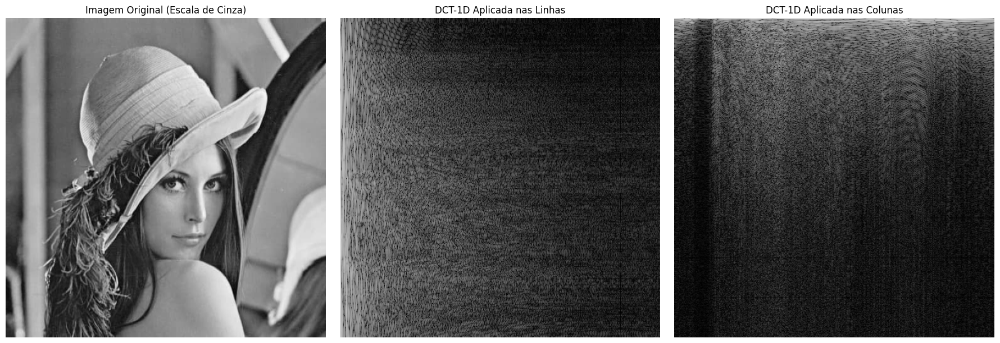

In [17]:
# Função para aplicar a DCT-1D em linhas ou colunas
def aplicar_dct_1d(imagem, eixo=0):
    dct_result = np.zeros_like(imagem, dtype=np.float32)
    if eixo == 0:  # Aplicar DCT nas linhas
        for i in range(imagem.shape[0]):
            dct_result[i, :] = dct(imagem[i, :], norm='ortho')
    elif eixo == 1:  # Aplicar DCT nas colunas
        for i in range(imagem.shape[1]):
            dct_result[:, i] = dct(imagem[:, i], norm='ortho')
    return dct_result

# Aplicar a DCT-1D nas linhas
dct_linhas = aplicar_dct_1d(matriz_imagem, eixo=0)

# Aplicar a DCT-1D nas colunas
dct_colunas = aplicar_dct_1d(matriz_imagem, eixo=1)

# Visualizar a imagem original, a DCT-1D aplicada nas linhas e a DCT-1D aplicada nas colunas
plt.figure(figsize=(18, 6))

# A - Imagem Original
plt.subplot(1, 3, 1)
plt.imshow(matriz_imagem, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - DCT-1D aplicada nas Linhas
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dct_linhas) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('DCT-1D Aplicada nas Linhas')
plt.axis('off')

# C - DCT-1D aplicada nas Colunas
plt.subplot(1, 3, 3)
plt.imshow(np.log(np.abs(dct_colunas) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('DCT-1D Aplicada nas Colunas')
plt.axis('off')

plt.tight_layout()
plt.show()

### Transformada Discreta do Seno - DST

Bibliotecas

In [18]:
from scipy.fftpack import dst, idst

In [19]:
imagem_original_dst = Image.open('lenna.jpg')
imagem_lena = imagem_original_dst.convert('L') # colocando a imagem em trons de cinza
imagem_lena_dst_Matriz = np.array(imagem_cinza)

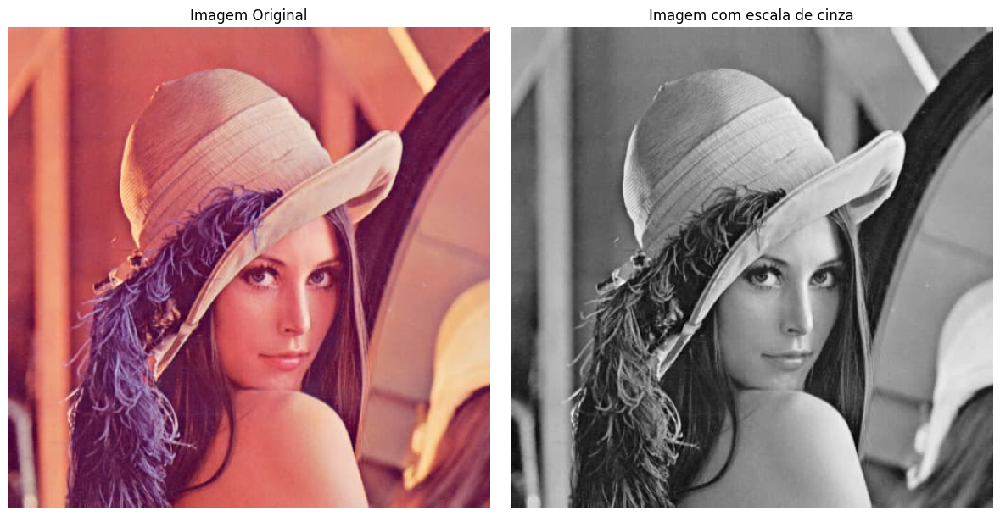

In [20]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(imagem_original_dst, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(imagem_lena, cmap='gray')
plt.title('Imagem com escala de cinza')
plt.axis('off')

plt.tight_layout()
plt.show()

In [21]:
# Função para aplicar a DST 2D (linha por linha e coluna por coluna)
def dst2(image):
    # Aplicar DST em cada linha
    temp = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        temp[i, :] = dst(image[i, :], type=2, norm='ortho')
    
    # Aplicar DST em cada coluna
    dst_result = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[1]):
        dst_result[:, i] = dst(temp[:, i], type=2, norm='ortho')
    
    return dst_result

In [22]:
# Função para aplicar a IDST 2D (linha por linha e coluna por coluna)
def idst2(image):
    # Aplicar IDST em cada coluna
    temp = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[1]):
        temp[:, i] = idst(image[:, i], type=2, norm='ortho')
    
    # Aplicar IDST em cada linha
    idst_result = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        idst_result[i, :] = idst(temp[i, :], type=2, norm='ortho')
    
    return idst_result

In [23]:
# Função para truncar os coeficientes da DST para n componentes
def truncar_dct_para_n_componentes(dct_image, num_componentes):
    truncado = np.zeros_like(dct_image)
    truncado[:num_componentes, :num_componentes] = dct_image[:num_componentes, :num_componentes]
    return truncado

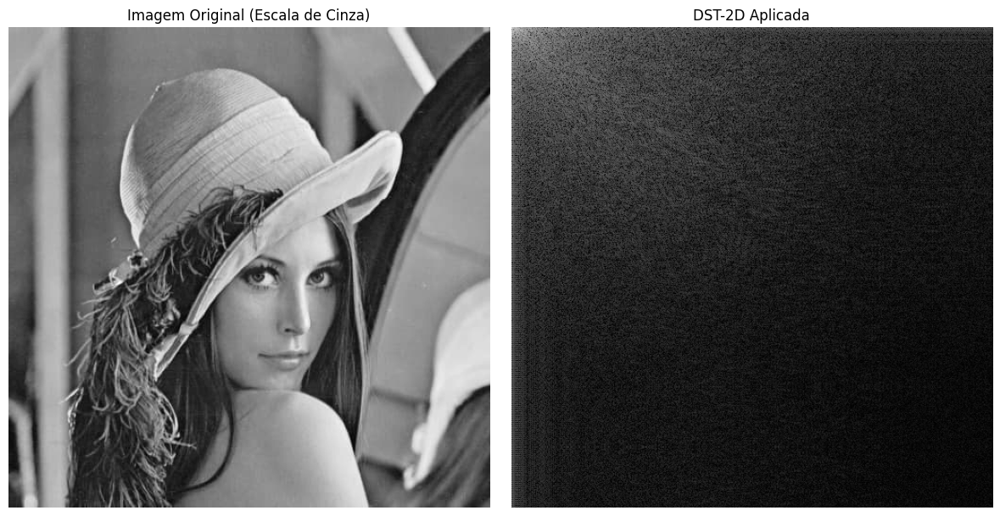

In [24]:
# Aplicar a DST 2D
dst_imagem = dst2(imagem_lena_dst_Matriz)

# Visualizar a imagem original e a DST 2D
plt.figure(figsize=(12, 6))

# A - Imagem original
plt.subplot(1, 2, 1)
plt.imshow(imagem_lena_dst_Matriz, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - DST 2D aplicada
plt.subplot(1, 2, 2)
plt.imshow(np.log(np.abs(dst_imagem) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('DST-2D Aplicada')
plt.axis('off')

plt.tight_layout()
plt.show()


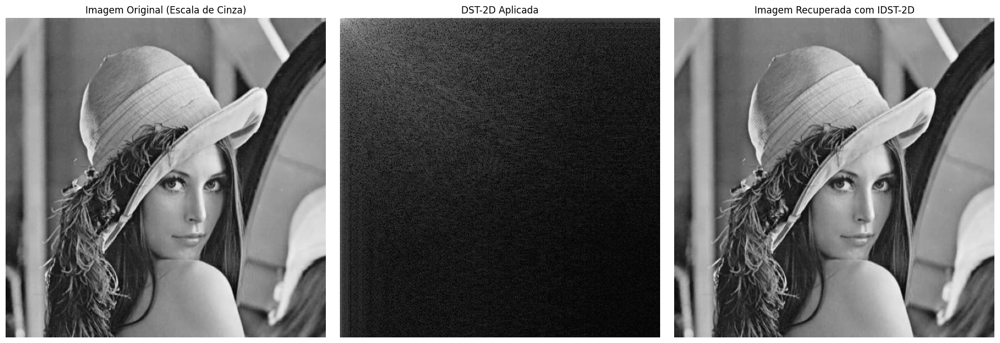

In [25]:
# Aplicar a DST 2D
dst_imagem = dst2(imagem_lena_dst_Matriz)

# Aplicar a IDST 2D para recuperar a imagem original
imagem_recuperada = idst2(dst_imagem)

# Visualizar a imagem original, a DST 2D e a imagem recuperada com IDST 2D
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_lena_dst_Matriz, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - DST 2D aplicada
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dst_imagem) + 1), cmap='gray')  # Escala logarítmica para visualização
plt.title('DST-2D Aplicada')
plt.axis('off')

# C - Imagem Recuperada com IDST 2D
plt.subplot(1, 3, 3)
plt.imshow(imagem_recuperada, cmap='gray')
plt.title('Imagem Recuperada com IDST-2D')
plt.axis('off')

plt.tight_layout()
plt.show()

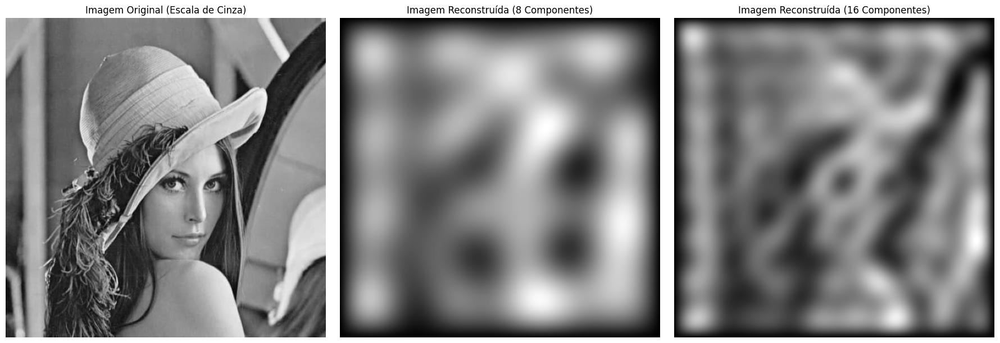

In [26]:
# Aplicar a DST 2D
dst_imagem = dst2(imagem_lena_dst_Matriz)

# Truncar para 8 componentes
dst_truncado_8 = truncar_dct_para_n_componentes(dst_imagem, 8)

# Truncar para 16 componentes
dst_truncado_16 = truncar_dct_para_n_componentes(dst_imagem, 16)

# Aplicar a IDST 2D para recuperar a imagem original com truncagem
imagem_recuperada_8 = idst2(dst_truncado_8)
imagem_recuperada_16 = idst2(dst_truncado_16)

# Visualizar a imagem original e as imagens reconstruídas com 8 e 16 componentes
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_lena_dst_Matriz, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Imagem reconstruída com 8 componentes
plt.subplot(1, 3, 2)
plt.imshow(imagem_recuperada_8, cmap='gray')
plt.title('Imagem Reconstruída (8 Componentes)')
plt.axis('off')

# C - Imagem reconstruída com 16 componentes
plt.subplot(1, 3, 3)
plt.imshow(imagem_recuperada_16, cmap='gray')
plt.title('Imagem Reconstruída (16 Componentes)')
plt.axis('off')

plt.tight_layout()
plt.show()


Sem o uso de Bibliotecas para DST

In [27]:
# Função para calcular a DST-2D
def dst2_manual(x):
    N = x.shape[0]  # Assumindo que a imagem é NxN
    y = np.zeros_like(x, dtype=float)
    factor = 2 / (N + 1)
    
    for u in range(N):
        for v in range(N):
            sum_val = 0
            for m in range(N):
                for n in range(N):
                    sum_val += x[m, n] * np.sin(np.pi * (m + 1) * (u + 1) / (N + 1)) * np.sin(np.pi * (n + 1) * (v + 1) / (N + 1))
            y[u, v] = factor * sum_val
    
    return y

In [28]:
# Função para calcular a IDST-2D
def idst2_manual(y):
    N = y.shape[0]  # Assumindo que a imagem é NxN
    x = np.zeros_like(y, dtype=float)
    factor = 2 / (N + 1)
    
    for m in range(N):
        for n in range(N):
            sum_val = 0
            for u in range(N):
                for v in range(N):
                    sum_val += y[u, v] * np.sin(np.pi * (m + 1) * (u + 1) / (N + 1)) * np.sin(np.pi * (n + 1) * (v + 1) / (N + 1))
            x[m, n] = factor * sum_val
    
    return x

In [29]:
# Carregar a imagem da Lena e convertê-la para escala de cinza
imagem_lena64 = Image.open('lena64.jpg').convert('L')
imagem_lena64 = np.array(imagem_lena64)

# Carregar a imagem da Lena e convertê-la para escala de cinza
imagem_lena = Image.open('lenna.jpg').convert('L')

# Reduzir o tamanho da imagem para 64x64
imagem_lena_64 = imagem_lena.resize((64, 64))

# Converter para matriz NumPy
imagem_lena_64 = np.array(imagem_lena_64)

# Exibir a dimensão da imagem para confirmar
print("Dimensão da imagem reduzida:", imagem_lena_64.shape)

Dimensão da imagem reduzida: (64, 64)


In [30]:
# Verificar as dimensões da imagem e ajustar se necessário
N = imagem_lena64.shape[0]
if imagem_lena64.shape[0] != imagem_lena64.shape[1]:
    raise ValueError("A imagem precisa ser NxN para essa implementação.")

# Aplicar a DST-2D manual
dst_imagem = dst2_manual(imagem_lena64)

# Aplicar a IDST-2D manual para recuperar a imagem original
imagem_recuperada = idst2_manual(dst_imagem)

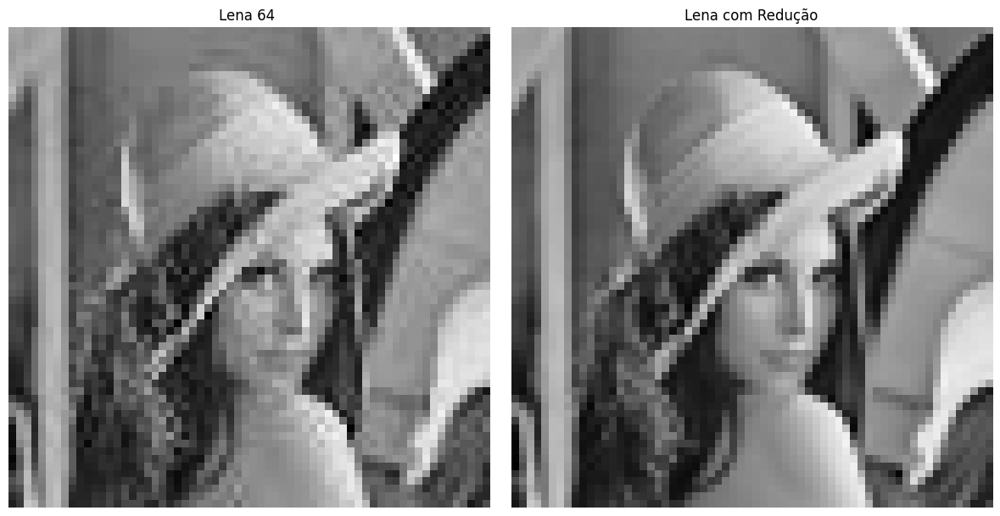

In [31]:
# Visualizar a imagem original e a DST 2D
plt.figure(figsize=(12, 6))

# A - Imagem original
plt.subplot(1, 2, 1)
plt.imshow(imagem_lena64, cmap='gray')
plt.title('Lena 64 ')
plt.axis('off')

# B - DST 2D aplicada
plt.subplot(1, 2, 2)
plt.imshow(imagem_lena_64, cmap='gray')  # Escala logarítmica para visualização
plt.title('Lena com Redução')
plt.axis('off')

plt.tight_layout()
plt.show()

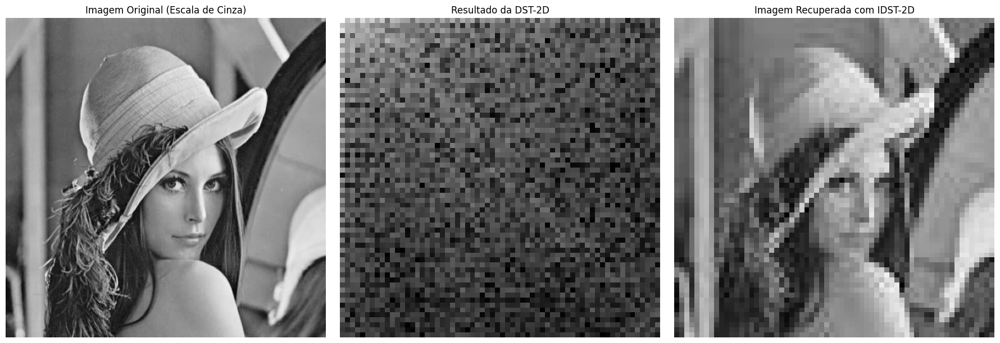

In [32]:
# Visualizar a imagem original, a DST-2D e a imagem recuperada
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_lena, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DST-2D
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dst_imagem) + 1), cmap='gray')  # Escala logarítmica para visualizar a DST
plt.title('Resultado da DST-2D')
plt.axis('off')

# C - Imagem recuperada com IDST-2D
plt.subplot(1, 3, 3)
plt.imshow(imagem_recuperada, cmap='gray')
plt.title('Imagem Recuperada com IDST-2D')
plt.axis('off')

plt.tight_layout()
plt.show()

In [33]:
# Função para aplicar a DST 2D em blocos de NxN
def dst2_blocos(image, bloco_tamanho):
    h, w = image.shape
    dst_result = np.zeros_like(image, dtype=np.float32)
    
    # Processar a imagem em blocos de NxN
    for i in range(0, h, bloco_tamanho):
        for j in range(0, w, bloco_tamanho):
            bloco = image[i:i+bloco_tamanho, j:j+bloco_tamanho]
            dst_bloco = dst2(bloco)
            dst_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = dst_bloco
    
    return dst_result

In [34]:
# Função para aplicar a IDST 2D em blocos de NxN
def idst2_blocos(image, bloco_tamanho):
    h, w = image.shape
    idst_result = np.zeros_like(image, dtype=np.float32)
    
    # Processar a imagem em blocos de NxN
    for i in range(0, h, bloco_tamanho):
        for j in range(0, w, bloco_tamanho):
            bloco = image[i:i+bloco_tamanho, j:j+bloco_tamanho]
            idst_bloco = idst2(bloco)
            idst_result[i:i+bloco_tamanho, j:j+bloco_tamanho] = idst_bloco
    
    return idst_result

In [35]:
# Aplicar a DST 2D em blocos de 8x8
dst_imagem_8x8 = dst2_blocos(imagem_lena_dst_Matriz, bloco_tamanho=8)

# Aplicar a DST 2D em blocos de 16x16
dst_imagem_16x16 = dst2_blocos(imagem_lena_dst_Matriz, bloco_tamanho=16)

# Aplicar a IDST 2D em blocos de 8x8 para recuperar a imagem original
imagem_recuperada_8x8 = idst2_blocos(dst_imagem_8x8, bloco_tamanho=8)

# Aplicar a IDST 2D em blocos de 16x16 para recuperar a imagem original
imagem_recuperada_16x16 = idst2_blocos(dst_imagem_16x16, bloco_tamanho=16)

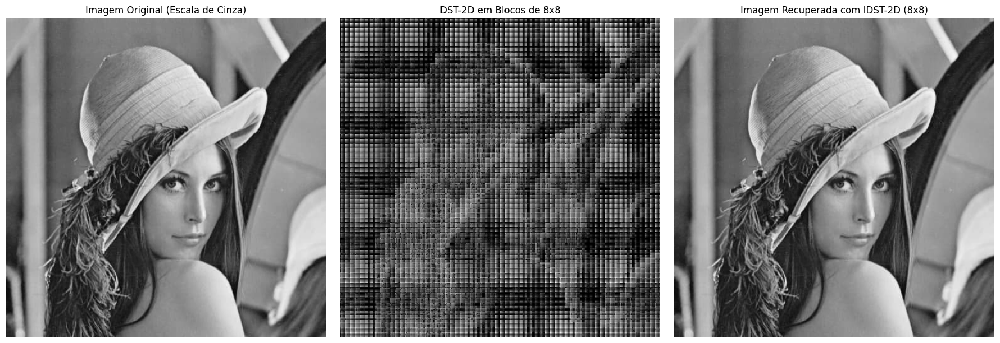

In [36]:
# Visualizar a imagem original, a DST-2D e a imagem recuperada (8x8)
plt.figure(figsize=(18, 6))

# A - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_lena_dst_Matriz, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# B - Resultado da DST-2D (8x8)
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dst_imagem_8x8) + 1), cmap='gray')
plt.title('DST-2D em Blocos de 8x8')
plt.axis('off')

# C - Imagem recuperada com IDST-2D (8x8)
plt.subplot(1, 3, 3)
plt.imshow(imagem_recuperada_8x8, cmap='gray')
plt.title('Imagem Recuperada com IDST-2D (8x8)')
plt.axis('off')

plt.tight_layout()
plt.show()

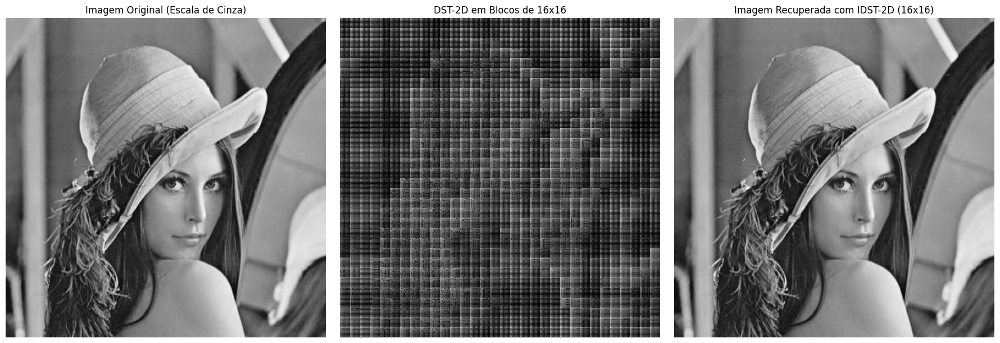

In [37]:
# Visualizar a imagem original, a DST-2D e a imagem recuperada (8x8)
plt.figure(figsize=(18, 6))

# D - Imagem original
plt.subplot(1, 3, 1)
plt.imshow(imagem_cinza, cmap='gray')
plt.title('Imagem Original (Escala de Cinza)')
plt.axis('off')

# E - Resultado da DST-2D (16x16)
plt.subplot(1, 3, 2)
plt.imshow(np.log(np.abs(dst_imagem_16x16) + 1), cmap='gray')
plt.title('DST-2D em Blocos de 16x16')
plt.axis('off')

# F - Imagem recuperada com IDST-2D (16x16)
plt.subplot(1, 3, 3)
plt.imshow(imagem_recuperada_16x16, cmap='gray')
plt.title('Imagem Recuperada com IDST-2D (16x16)')
plt.axis('off')

plt.tight_layout()
plt.show()


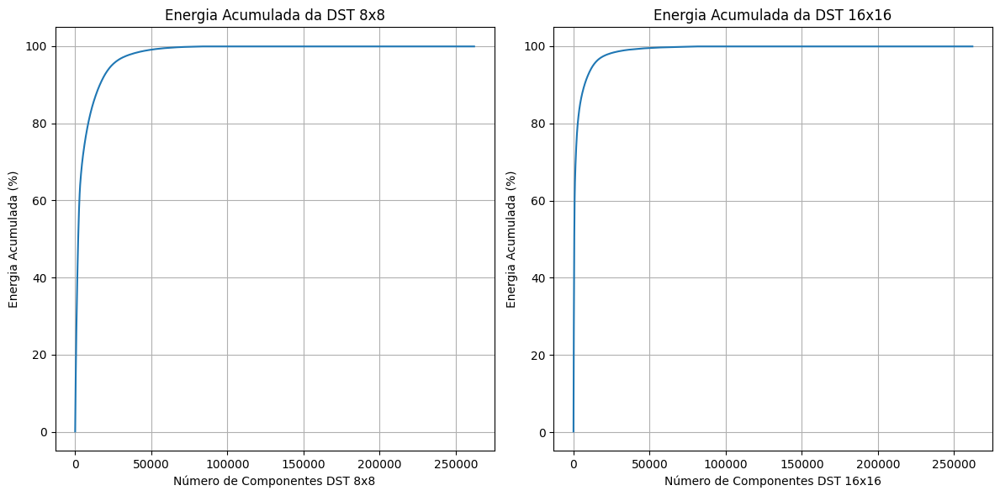

In [38]:
# Calcular a energia acumulada da DCT
energia_acumulada_percentual_dst_8x8 = calcular_energia_acumulada(dst_imagem_8x8)
energia_acumulada_percentual_dst_16x16 = calcular_energia_acumulada(dst_imagem_16x16)

# Visualizar o gráfico da função de entrada (alta correlação) e a concentração de energia para DST
plt.figure(figsize=(12, 6))

# A - Plotar a energia acumulada
plt.subplot(1, 2, 1)
plt.plot(energia_acumulada_percentual_dst_8x8)
plt.title('Energia Acumulada da DST 8x8')
plt.xlabel('Número de Componentes DST 8x8')
plt.ylabel('Energia Acumulada (%)')
plt.grid(True)

# B - Plotar a energia acumulada DST 16x16
plt.subplot(1, 2, 2)
plt.plot(energia_acumulada_percentual_dst_16x16)
plt.title('Energia Acumulada da DST 16x16')
plt.xlabel('Número de Componentes DST 16x16')
plt.ylabel('Energia Acumulada (%)')
plt.grid(True)

plt.tight_layout()
plt.show()

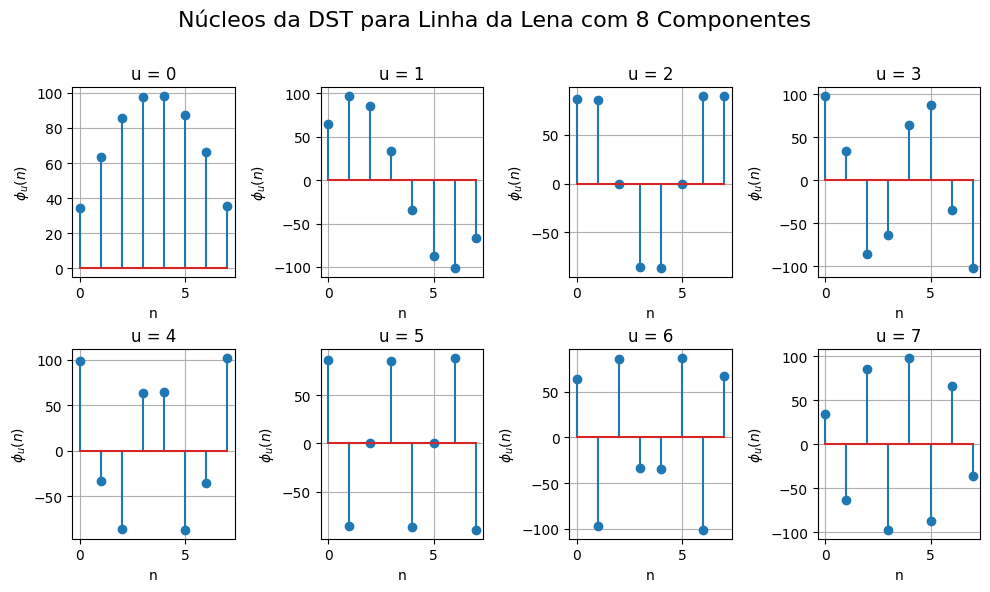

In [39]:
# Função para gerar os vetores base da DST-1D
def gerar_vetores_base_dst(N):
    base_dst = np.zeros((N, N))
    for u in range(N):
        for n in range(N):
            base_dst[u, n] = np.sin(np.pi * (u + 1) * (n + 1) / (N + 1))
    return base_dst

# Selecionar uma linha da imagem da Lena (linha do meio)
linha_lena = imagem_lena_dst_Matriz[imagem_lena_dst_Matriz.shape[0] // 2, :8]  # Pegando apenas os 8 primeiros componentes

# Aplicar a DST na linha da Lena
dst_linha_lena = dst(linha_lena, type=2, norm='ortho')

# Gerar os vetores base da DST
base_dst_lena = gerar_vetores_base_dst(8)

# Visualizar os vetores base da DST para a linha da imagem da Lena
plt.figure(figsize=(10, 6))

for u in range(8):
    plt.subplot(2, 4, u + 1)  # Criar subplots para cada vetor base
    plt.stem(base_dst_lena[u] * linha_lena)  # Visualizar o efeito da DST
    plt.title(f'u = {u}')
    plt.xlabel('n')
    plt.ylabel('$\phi_u(n)$')
    plt.grid(True)

plt.tight_layout()
plt.suptitle('Núcleos da DST para Linha da Lena com 8 Componentes', fontsize=16)
plt.subplots_adjust(top=0.85)
plt.show()

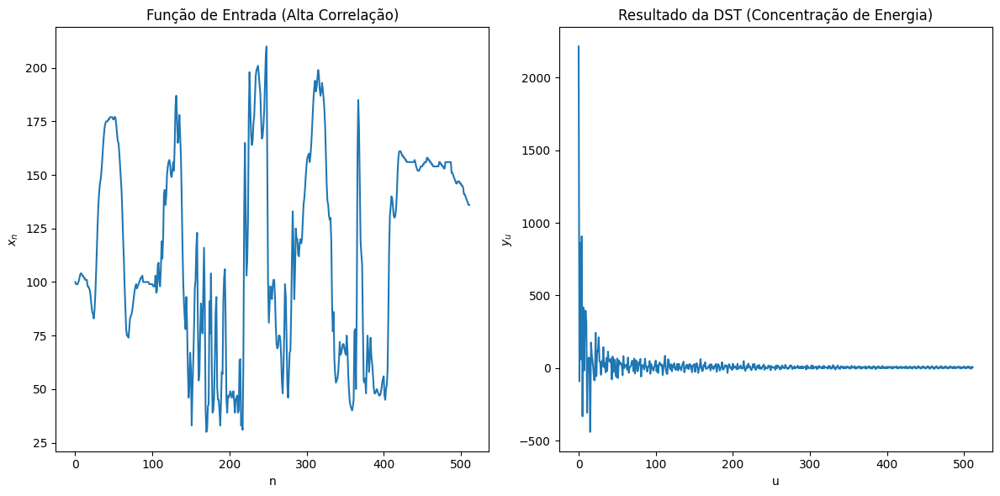

In [40]:
# Selecionar uma linha da imagem (por exemplo, a linha do meio)
linha = imagem_lena_dst_Matriz[imagem_lena_dst_Matriz.shape[0] // 2, :]

# Aplicar a DCT e DST 1D na linha
dst_linha = dst(linha, type=2, norm='ortho')

# Visualizar o gráfico da função de entrada (alta correlação) e a concentração de energia para DST
plt.figure(figsize=(12, 6))

# A - Função de entrada (Linha da Imagem - Alta Correlação)
plt.subplot(1, 2, 1)
plt.plot(linha)
plt.title('Função de Entrada (Alta Correlação)')
plt.xlabel('n')
plt.ylabel('$x_n$')

# B - Resultado da DST (Concentração de Energia)
plt.subplot(1, 2, 2)
plt.plot(dst_linha)
plt.title('Resultado da DST (Concentração de Energia)')
plt.xlabel('u')
plt.ylabel('$y_u$')

plt.tight_layout()
plt.show()

### CAS Transform

In [41]:
# Carregar a imagem da Lena e convertê-la para escala de cinza
imagem_lena_cas = Image.open('lenna.jpg').convert('L')
matriz_lena_cas = np.array(imagem_lena_cas)

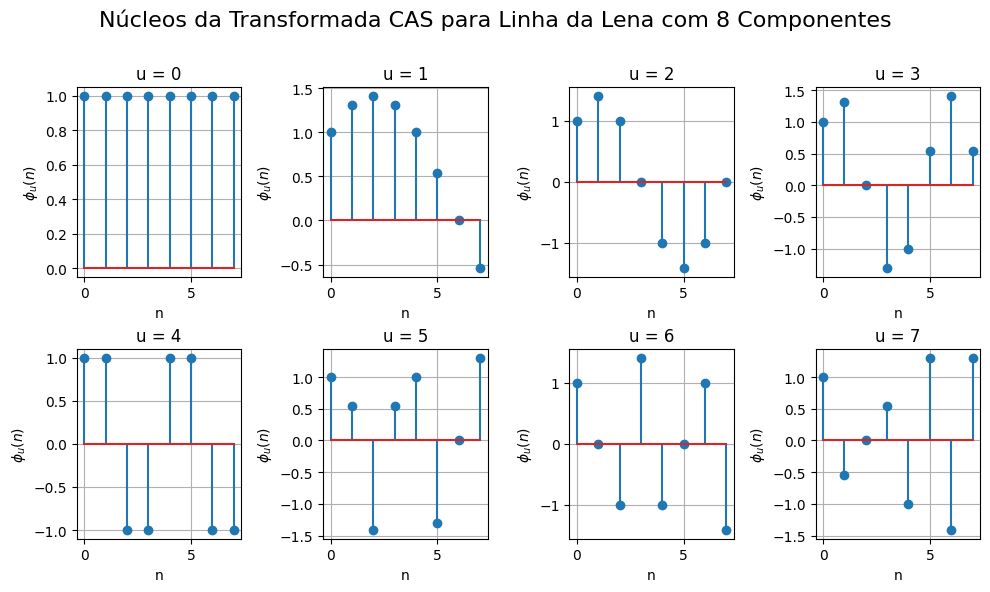

In [42]:
# Função para calcular a Transformada CAS (Combinada de Cosseno e Seno)
def cas_transform(x):
    N = len(x)
    cas_result = np.zeros((N, N))
    for u in range(N):
        for n in range(N):
            cas_result[u, n] = np.cos(np.pi * u * n / N) + np.sin(np.pi * u * n / N)
    return cas_result

# Selecionar uma linha da imagem da Lena (linha do meio)
linha_lena = matriz_lena_cas[matriz_lena_cas.shape[0] // 2, :8]  # Pegando apenas os 8 primeiros componentes

# Aplicar a Transformada CAS na linha da Lena
cas_linha_lena = cas_transform(linha_lena)

# Visualizar os núcleos da Transformada CAS para a linha da imagem da Lena
plt.figure(figsize=(10, 6))

for u in range(8):
    plt.subplot(2, 4, u + 1)
    plt.stem(cas_linha_lena[u, :])
    plt.title(f'u = {u}')
    plt.xlabel('n')
    plt.ylabel('$\phi_{u}(n)$')
    plt.grid(True)

plt.tight_layout()
plt.suptitle('Núcleos da Transformada CAS para Linha da Lena com 8 Componentes', fontsize=16)
plt.subplots_adjust(top=0.85)
plt.show()


In [43]:
# Função para aplicar CAS Transform em um bloco
def cas_transform_bloco(bloco):
    temp = np.zeros_like(bloco, dtype=np.float32)
    
    # Aplicar DCT nas linhas
    for i in range(bloco.shape[0]):
        temp[i, :] = dct(bloco[i, :], type=2, norm='ortho')
    
    # Aplicar DST nas colunas
    for i in range(bloco.shape[1]):
        temp[:, i] = dst(temp[:, i], type=2, norm='ortho')
    
    return temp

In [44]:
# Função para aplicar a inversa da CAS Transform em um bloco
def inverse_cas_transform_bloco(bloco):
    temp = np.zeros_like(bloco, dtype=np.float32)
    
    # Aplicar IDST nas colunas
    for i in range(bloco.shape[1]):
        temp[:, i] = idst(bloco[:, i], type=2, norm='ortho')
    
    # Aplicar IDCT nas linhas
    for i in range(bloco.shape[0]):
        temp[i, :] = idct(temp[i, :], type=2, norm='ortho')
    
    return temp

In [45]:
# Função para dividir a imagem em blocos de NxN
def dividir_em_blocos(matriz_imagem, N):
    h, w = matriz_imagem.shape
    blocos = []
    for i in range(0, h, N):
        for j in range(0, w, N):
            bloco = matriz_imagem[i:i+N, j:j+N]
            blocos.append(bloco)
    return blocos

In [46]:
# Função para truncar os coeficientes de um bloco para manter apenas os primeiros n coeficientes
def truncar_bloco(bloco, num_coef):
    truncado = np.zeros_like(bloco)
    truncado[:num_coef, :num_coef] = bloco[:num_coef, :num_coef]
    return truncado

In [47]:
# Função para reconstruir a imagem a partir de blocos
def reconstruir_imagem(blocos, tamanho_imagem, N):
    h, w = tamanho_imagem
    imagem_recuperada = np.zeros((h, w), dtype=np.float32)
    
    bloco_index = 0
    for i in range(0, h, N):
        for j in range(0, w, N):
            imagem_recuperada[i:i+N, j:j+N] = blocos[bloco_index]
            bloco_index += 1
            
    return imagem_recuperada

In [48]:
# Parâmetros para blocos de 8x8 e 16x16
tamanho_bloco_8 = 8
tamanho_bloco_16 = 16
tamanho_bloco_64 = 64

# Dividir a imagem em blocos 8x8 e 16x16
blocos_8x8 = dividir_em_blocos(matriz_lena_cas, tamanho_bloco_8)
blocos_16x16 = dividir_em_blocos(matriz_lena_cas, tamanho_bloco_16)
blocos_64x64 = dividir_em_blocos(matriz_lena_cas, tamanho_bloco_64)

# Aplicar a CAS Transform e truncar os coeficientes
blocos_8x8_transformados = [cas_transform_bloco(bloco) for bloco in blocos_8x8]
blocos_16x16_transformados = [cas_transform_bloco(bloco) for bloco in blocos_16x16]
blocos_64x64_transformados = [cas_transform_bloco(bloco) for bloco in blocos_64x64]

blocos_8x8_truncado = [truncar_bloco(bloco, 8) for bloco in blocos_8x8_transformados]
blocos_16x16_truncado = [truncar_bloco(bloco, 16) for bloco in blocos_16x16_transformados]
blocos_64x64_truncado = [truncar_bloco(bloco, 64) for bloco in blocos_64x64_transformados]

# Aplicar a inversa da CAS Transform para reconstruir a imagem
blocos_8x8_reconstruidos = [inverse_cas_transform_bloco(bloco) for bloco in blocos_8x8_truncado]
blocos_16x16_reconstruidos = [inverse_cas_transform_bloco(bloco) for bloco in blocos_16x16_truncado]
blocos_64x64_reconstruidos = [inverse_cas_transform_bloco(bloco) for bloco in blocos_64x64_truncado]

# Reconstruir a imagem completa a partir dos blocos
imagem_recuperada_8x8 = reconstruir_imagem(blocos_8x8_reconstruidos, matriz_lena_cas.shape, tamanho_bloco_8)
imagem_recuperada_16x16 = reconstruir_imagem(blocos_16x16_reconstruidos, matriz_lena_cas.shape, tamanho_bloco_16)
imagem_recuperada_64x64 = reconstruir_imagem(blocos_64x64_reconstruidos, matriz_lena_cas.shape, tamanho_bloco_64)

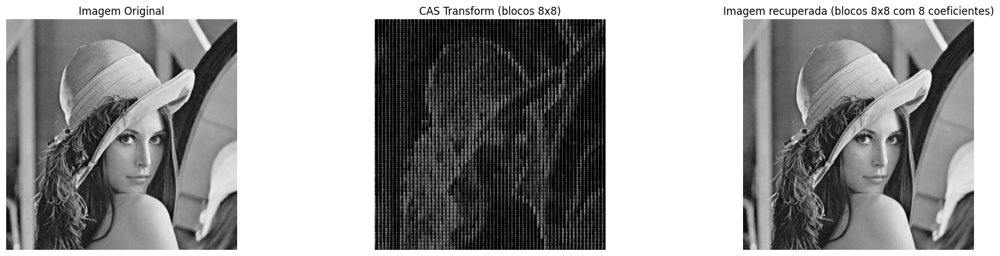

In [49]:
# Visualizar os resultados
plt.figure(figsize=(18, 12))

# A - Imagem original
plt.subplot(3, 3, 1)
plt.imshow(matriz_lena_cas, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')

# B - Imagem com blocos 8x8 (CAS Transform)
plt.subplot(3, 3, 2)
plt.imshow(np.log(np.abs(reconstruir_imagem(blocos_8x8_transformados, matriz_lena_cas.shape, tamanho_bloco_8)) + 1), cmap='gray')
plt.title('CAS Transform (blocos 8x8)')
plt.axis('off')

# C - Imagem com blocos 8x8 truncados para 8 coeficientes
plt.subplot(3, 3, 3)
plt.imshow(imagem_recuperada_8x8, cmap='gray')
plt.title('Imagem recuperada (blocos 8x8 com 8 coeficientes)')
plt.axis('off')

plt.tight_layout()
plt.show()

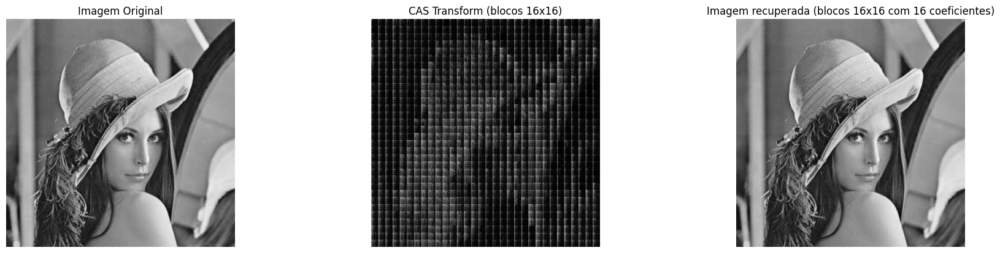

In [57]:
# Visualizar os resultados
plt.figure(figsize=(18, 12))

# A - Imagem original
plt.subplot(3, 3, 1)
plt.imshow(matriz_lena_cas, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')

# B - Imagem com blocos 16x16 (CAS Transform)
plt.subplot(3, 3, 2)
plt.imshow(np.log(np.abs(reconstruir_imagem(blocos_16x16_transformados, matriz_lena_cas.shape, tamanho_bloco_16)) + 1), cmap='gray')
plt.title('CAS Transform (blocos 16x16)')
plt.axis('off')

# C - Imagem com blocos 16x16 truncados para 16 coeficientes
plt.subplot(3, 3, 3)
plt.imshow(imagem_recuperada_16x16, cmap='gray')
plt.title('Imagem recuperada (blocos 16x16 com 16 coeficientes)')
plt.axis('off')

plt.tight_layout()
plt.show()

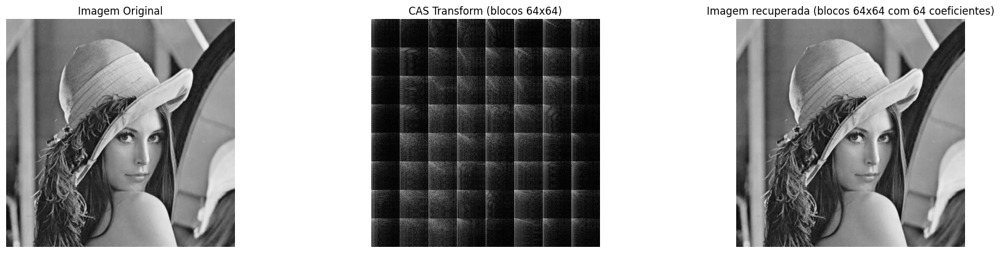

In [51]:
# Visualizar os resultados
plt.figure(figsize=(18, 12))

# A - Imagem original
plt.subplot(3, 3, 1)
plt.imshow(matriz_lena_cas, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')

# B - Imagem com blocos 16x16 (CAS Transform)
plt.subplot(3, 3, 2)
plt.imshow(np.log(np.abs(reconstruir_imagem(blocos_64x64_transformados, matriz_lena_cas.shape, tamanho_bloco_64)) + 1), cmap='gray')
plt.title('CAS Transform (blocos 64x64)')
plt.axis('off')

# C - Imagem com blocos 16x16 truncados para 16 coeficientes
plt.subplot(3, 3, 3)
plt.imshow(imagem_recuperada_64x64, cmap='gray')
plt.title('Imagem recuperada (blocos 64x64 com 64 coeficientes)')
plt.axis('off')

plt.tight_layout()
plt.show()

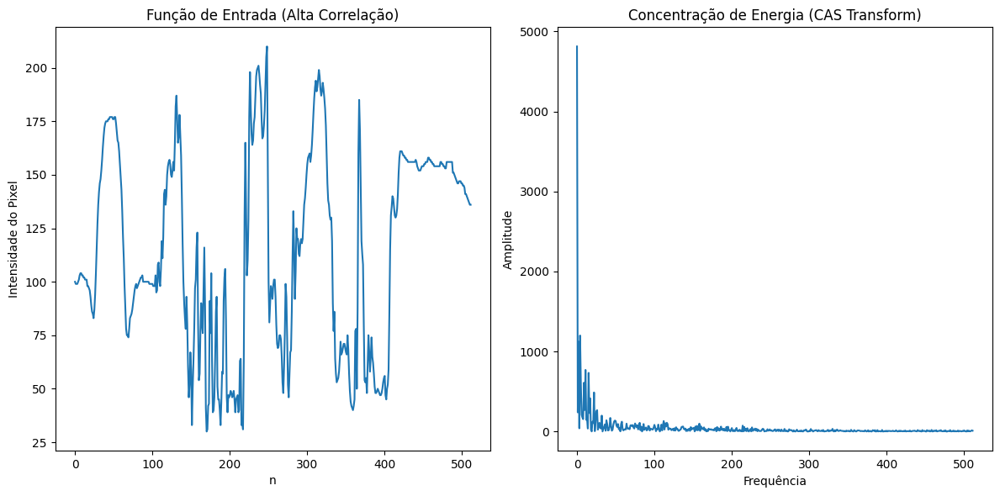

In [52]:
# Selecionar uma linha da imagem (por exemplo, a linha do meio)
linha_lena = matriz_lena_cas[matriz_lena_cas.shape[0] // 2, :]

# Aplicar a DCT e DST na linha (CAS Transform)
cas_linha_lena = dct(linha_lena, type=2, norm='ortho') + dst(linha_lena, type=2, norm='ortho')

# Visualizar a função de entrada (Alta correlação) e a concentração de energia
plt.figure(figsize=(12, 6))

# A - Função de entrada (Linha da Imagem - Alta Correlação)
plt.subplot(1, 2, 1)
plt.plot(linha_lena)
plt.title('Função de Entrada (Alta Correlação)')
plt.xlabel('n')
plt.ylabel('Intensidade do Pixel')

# B - Concentração de Energia (CAS Transform)
plt.subplot(1, 2, 2)
plt.plot(np.abs(cas_linha_lena))
plt.title('Concentração de Energia (CAS Transform)')
plt.xlabel('Frequência')
plt.ylabel('Amplitude')

plt.tight_layout()
plt.show()

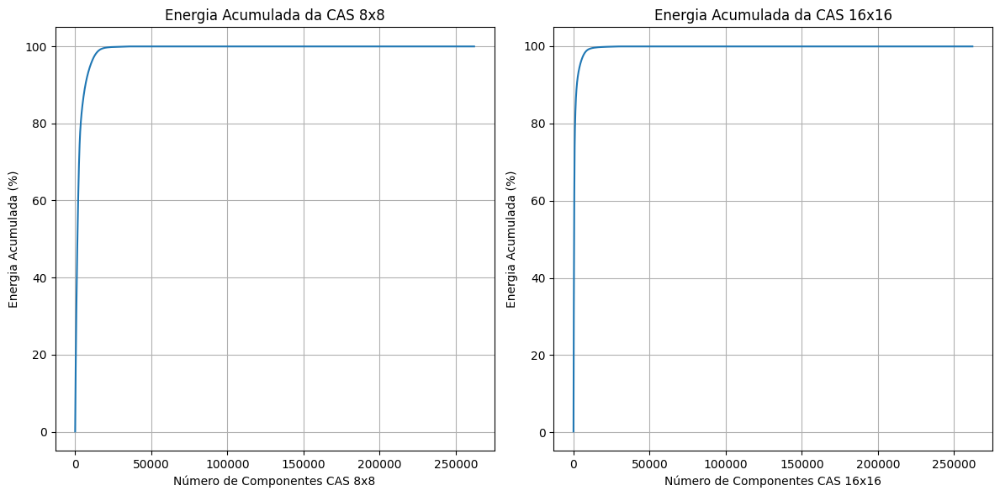

In [59]:
# Calcular a energia acumulada da DCT
energia_acumulada_percentual_cas_8x8 = calcular_energia_acumulada(reconstruir_imagem(blocos_8x8_transformados, matriz_lena_cas.shape, tamanho_bloco_8))
energia_acumulada_percentual_cas_16x16 = calcular_energia_acumulada(reconstruir_imagem(blocos_16x16_transformados, matriz_lena_cas.shape, tamanho_bloco_16))

# Visualizar o gráfico da função de entrada (alta correlação) e a concentração de energia para DST
plt.figure(figsize=(12, 6))

# A - Plotar a energia acumulada
plt.subplot(1, 2, 1)
plt.plot(energia_acumulada_percentual_cas_8x8)
plt.title('Energia Acumulada da CAS 8x8')
plt.xlabel('Número de Componentes CAS 8x8')
plt.ylabel('Energia Acumulada (%)')
plt.grid(True)

# B - Plotar a energia acumulada DST 16x16
plt.subplot(1, 2, 2)
plt.plot(energia_acumulada_percentual_cas_16x16)
plt.title('Energia Acumulada da CAS 16x16')
plt.xlabel('Número de Componentes CAS 16x16')
plt.ylabel('Energia Acumulada (%)')
plt.grid(True)

plt.tight_layout()
plt.show()

CAS Transform Sem Biblioteca

In [53]:
# Função para aplicar CAS Transform 2D (cosseno + seno)
def cas_transform(image):
    N = image.shape[0]
    cas_result = np.zeros_like(image, dtype=np.float32)
    
    # CAS Transform - soma de cossenos e senos
    for u in range(N):
        for v in range(N):
            for x in range(N):
                for y in range(N):
                    cas_result[u, v] += (
                        np.cos(np.pi * u * x / N) * np.cos(np.pi * v * y / N) + 
                        np.sin(np.pi * u * x / N) * np.sin(np.pi * v * y / N)
                    ) * image[x, y]
    
    return cas_result

In [54]:
# Função para aplicar a inversa da CAS Transform 2D
def inverse_cas_transform(cas_image):
    N = cas_image.shape[0]
    inv_cas_result = np.zeros_like(cas_image, dtype=np.float32)
    
    # Inversa CAS Transform
    for x in range(N):
        for y in range(N):
            for u in range(N):
                for v in range(N):
                    inv_cas_result[x, y] += (
                        np.cos(np.pi * u * x / N) * np.cos(np.pi * v * y / N) + 
                        np.sin(np.pi * u * x / N) * np.sin(np.pi * v * y / N)
                    ) * cas_image[u, v]
    
    return inv_cas_result / (N**2)

In [55]:
# Função para truncar coeficientes da CAS para manter apenas os primeiros n coeficientes
def truncar_cas(cas_image, num_coef):
    cas_truncado = np.zeros_like(cas_image)
    cas_truncado[:num_coef, :num_coef] = cas_image[:num_coef, :num_coef]
    return cas_truncado

In [ ]:
# Aplicar a CAS Transform 2D
cas_imagem = cas_transform(matriz_lena_cas)

# Manter apenas os primeiros 8 coeficientes
cas_8_coef = truncar_cas(cas_imagem, 8)

# Inversa da CAS Transform para os primeiros 8 coeficientes
imagem_recuperada_8_coef = inverse_cas_transform(cas_8_coef)

# Manter apenas os primeiros 16 coeficientes
cas_16_coef = truncar_cas(cas_imagem, 16)

# Inversa da CAS Transform para os primeiros 16 coeficientes
imagem_recuperada_16_coef = inverse_cas_transform(cas_16_coef)

In [ ]:
# Visualizar os resultados
plt.figure(figsize=(18, 10))

# A - Imagem original
plt.subplot(2, 3, 1)
plt.imshow(imagem_lena, cmap='gray')
plt.title('Imagem Original')
plt.axis('off')

# B - Resultado da CAS Transform
plt.subplot(2, 3, 2)
plt.imshow(np.log(np.abs(cas_imagem) + 1), cmap='gray')
plt.title('Resultado da CAS Transform (Escala logarítmica)')
plt.axis('off')

# C - CAS com 8 coeficientes
plt.subplot(2, 3, 3)
plt.imshow(np.log(np.abs(cas_8_coef) + 1), cmap='gray')
plt.title('CAS com 8 coeficientes')
plt.axis('off')

# D - Imagem recuperada com 8 coeficientes
plt.subplot(2, 3, 4)
plt.imshow(imagem_recuperada_8_coef, cmap='gray')
plt.title('Imagem recuperada com 8 coeficientes')
plt.axis('off')

# E - CAS com 16 coeficientes
plt.subplot(2, 3, 5)
plt.imshow(np.log(np.abs(cas_16_coef) + 1), cmap='gray')
plt.title('CAS com 16 coeficientes')
plt.axis('off')

# F - Imagem recuperada com 16 coeficientes
plt.subplot(2, 3, 6)
plt.imshow(imagem_recuperada_16_coef, cmap='gray')
plt.title('Imagem recuperada com 16 coeficientes')
plt.axis('off')

plt.tight_layout()
plt.show()
